# Visualization in Python

**PS: Many pieces of this notebook have been scavenged from other visualization notebooks and galleries. But the main things are from Tal Yarkoni's [visualization-in-python notebook](https://github.com/neurohackweek/visualization-in-python).**

# General Overview

In this notebook, we will cover the following python packages. Some of them are exclusively for visualization while others like `Pandas` have many other purposes:

- [Matplotlib](https://matplotlib.org/)
- [Seaborn](http://seaborn.pydata.org/)
- [Pandas](http://pandas.pydata.org/)
- [Bokeh](https://bokeh.pydata.org)
- [Plotly](https://plot.ly/python/)

The visualization of the first three is all based on `matplotlib` and use `static images`. While the last three create `HTML` outputs and allow much more `interactive plots`. We will talk about each one as we go along.

**Please note**: This notebook is intended as a _showcase_ of what's possible with regard to plotting in `python`. There's a lot going on in this notebook and we don't expect (or intended that) you learn everything there is, but provide an overview and resources that should enable you to start creating plots in `python`.  

## Python-graph-gallery
Check out the very helpful and cool new homepage https://python-graph-gallery.com/ to see how you can create different kinds of graphs.

## Preparation

As with most things in Python, we first load the relevant packages. Here we load three important packages:

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

The first line in the cell above is specific to `Jupyter notebooks`. It tells the interpreter to capture `figures` and embed them in the browser. Otherwise, they would end up almost in digital ether.

## The Dataset

For example purposes, we will make use of a phenotypic dataset from the [ABIDE II](http://fcon_1000.projects.nitrc.org/indi/abide/abide_II.html) consortium. This amazing international multi-site dataset contains data from individuals diagnosed with Autism Spectrum Disorder (ASD) and healthy controls. We will use a version of the [phenotypic data available here](http://fcon_1000.projects.nitrc.org/indi/abide/abide_II.html) from a single site (Kennedy Krieger Institute). Thus please download the dataset from the linked resource providing your [NITRC](https://www.nitrc.org/) credentials.

Let's read this from the Web using Pandas. We explicitly specify that missing values are noted in the dataset as `'n/a'`.

In [2]:
df = pd.read_csv('ABIDEII-KKI_1.csv', na_values=['n/a'])

In the following cell we remove all columns that have missing values.

In [3]:
sub_df = df.dropna(axis=1)
sub_df.head()

,SITE_ID,SUB_ID,DX_GROUP,AGE_AT_SCAN,SEX,HANDEDNESS_CATEGORY,HANDEDNESS_SCORES,VIQ,PIQ,VIQ_TEST_TYPE,PIQ_TEST_TYPE,NONASD_PSYDX_ICD9CODE,NONASD_PSYDX_LABEL,EYE_STATUS_AT_SCAN
0,ABIDEII-KKI_1,29273,1,8.476712,1,1,82,142,104,WISC-IV,WISC-IV,314.01,ADHD combined,1
1,ABIDEII-KKI_1,29274,1,9.246575,1,1,83,104,79,WISC-IV,WISC-IV,296.3,MDD (past),1
2,ABIDEII-KKI_1,29275,1,8.646575,1,1,100,130,121,WISC-IV,WISC-IV,313.81,ODD,1
3,ABIDEII-KKI_1,29276,1,9.216438,2,1,100,128,115,WISC-IV,WISC-IV,314.01; 300.29,ADHD combined; simple phobia,1
4,ABIDEII-KKI_1,29277,1,12.789041,1,1,90,132,123,WISC-IV,WISC-IV,314.01,ADHD hyperactive/impulsive,1


Using the `keys` method we can look at all the column headings that are left.

In [4]:
list(sub_df.keys())

['SITE_ID',
 'SUB_ID',
 'DX_GROUP',
 'AGE_AT_SCAN ',
 'SEX',
 'HANDEDNESS_CATEGORY',
 'HANDEDNESS_SCORES',
 'VIQ',
 'PIQ',
 'VIQ_TEST_TYPE',
 'PIQ_TEST_TYPE',
 'NONASD_PSYDX_ICD9CODE',
 'NONASD_PSYDX_LABEL',
 'EYE_STATUS_AT_SCAN']

Lets now see how we can visualize the information in this dataset (`sub_df`). Python has quite a lot of visualization packages. Undeniably, the most famous and at the same time versatile, that additionally is the basis of most others, is [matplotlib](https://matplotlib.org/). 

# `matplotlib`
* The most widely-used `Python` plotting library
* Initially modeled on `MATLAB`'s plotting system
* Designed to provide complete control over a plot

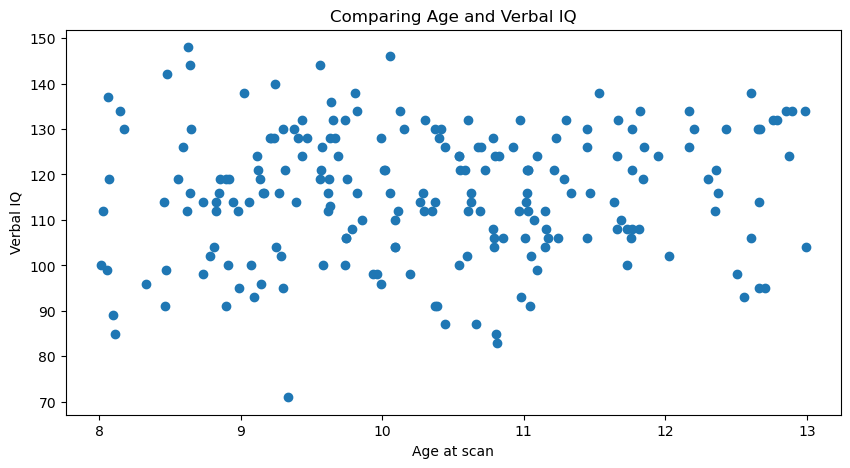

In [5]:
plt.figure(figsize=(10, 5))
plt.scatter(sub_df['AGE_AT_SCAN '], sub_df.VIQ)
plt.xlabel('Age at scan')
plt.ylabel('Verbal IQ')
plt.title('Comparing Age and Verbal IQ');

Thinking about how plotting works with `matplotlib`, we can explore a different approach to plotting, where we at first generate our figure and then access certain parts of it, in order to modify them. Let's create a `figure` with 3 `subplots`, side by side, including a `scatterplot`, `bar plots` and one `scatter plot` with different colors per `group`:

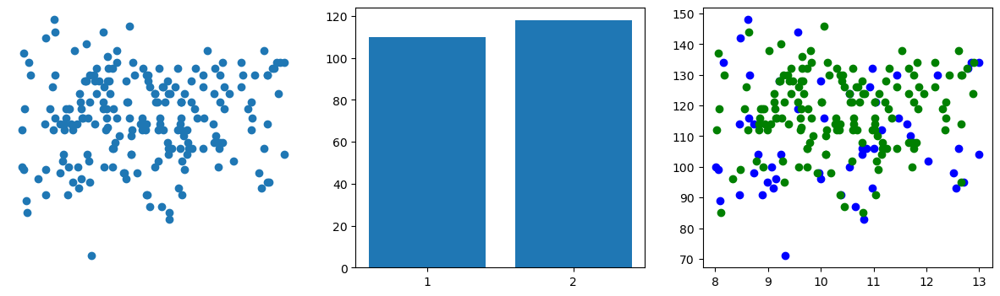

In [6]:
# Set up a figure with 3 columns
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Scatter plot in left column
axes[0].scatter(sub_df['AGE_AT_SCAN '], sub_df['VIQ'])
axes[0].axis('off')

# Mean group viq in middle column
means = sub_df.groupby('DX_GROUP')['VIQ'].mean()
axes[1].bar(np.arange(len(means))+1, means)

# Note how **broken** this is without additional code
axes[1].set_xticks(means.index)

# More scatter plots, breaking up by group in right column
colors = ['blue', 'green']
for i, (s, grp) in enumerate(sub_df.groupby('DX_GROUP')):
    axes[2].scatter(grp['AGE_AT_SCAN '], grp['VIQ'], c=colors[i])

## Exercise 1

Create a `figure` and replot the second `scatterplot` above, grouping by `sex` instead of `dx_group`. 
- Set the figure size to a ratio of 8 (wide) x 5 (height)
- Use the colors `red` and `gray`
- Set the opacity of the points to 0.5
- Label the axes
- Add a legend

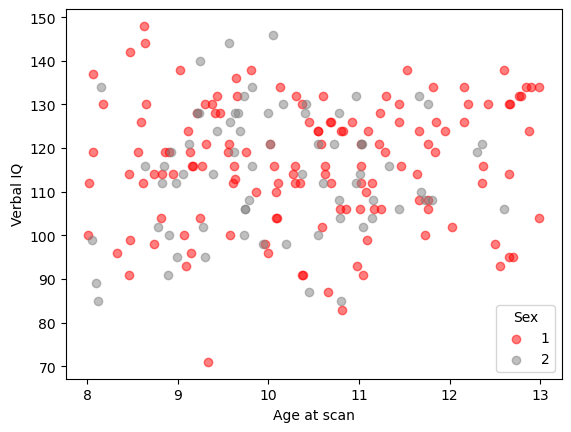

In [8]:
# Create solution here
fig = plt.figure()
colors = ['red', 'gray']
for i, (s, grp) in enumerate(sub_df.groupby('SEX')):
    plt.scatter(grp['AGE_AT_SCAN '], grp['VIQ'], c=colors[i], alpha=0.5, label=s)
plt.xlabel('Age at scan')
plt.ylabel('Verbal IQ')
plt.legend(title='Sex', loc='lower right')
plt.show()

## Showcases from the Gallery

As this notebook is intended as s a showcase to provide you with examples of what `matplotlib` can do, we're going to use some examples directly from the [matplotlib gallery](https://matplotlib.org/gallery/index.html). Let's check different histograms:

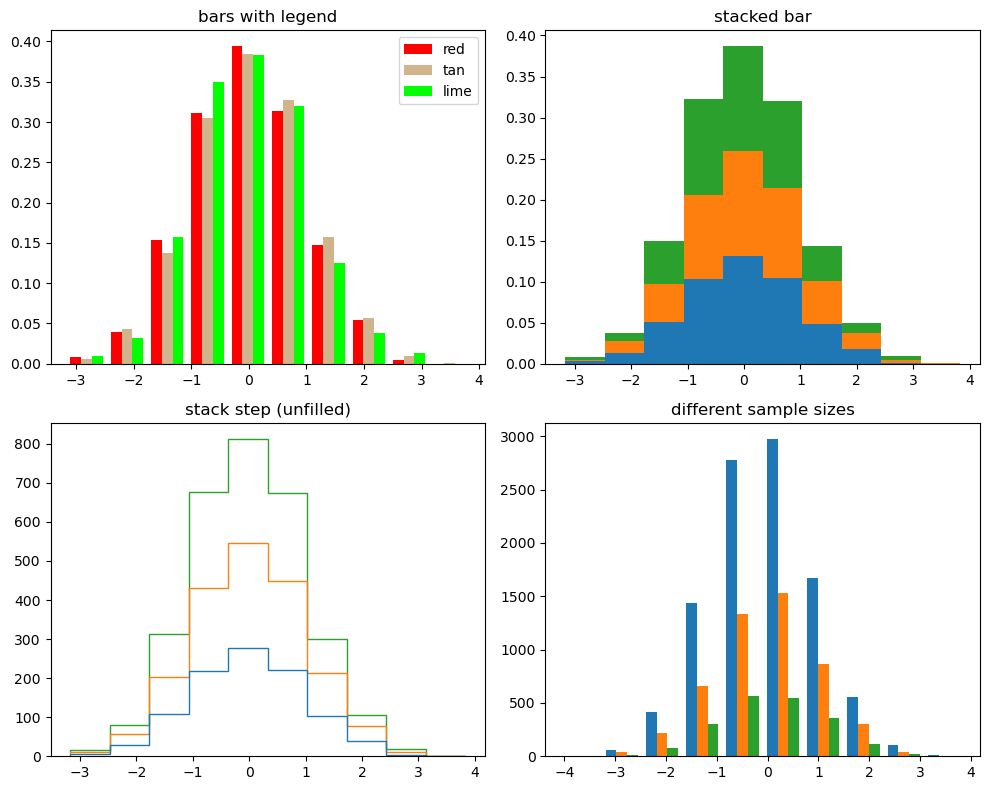

In [9]:
# Adapted from https://matplotlib.org/gallery/statistics/histogram_multihist.html

import numpy as np
import matplotlib.pyplot as plt

n_bins = 10
x = np.random.randn(1000, 3)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))
ax0, ax1, ax2, ax3 = axes.flatten()

colors = ['red', 'tan', 'lime']
ax0.hist(x, n_bins, density=1, histtype='bar', color=colors, label=colors)
ax0.legend(prop={'size': 10})
ax0.set_title('bars with legend')

ax1.hist(x, n_bins, density=1, histtype='bar', stacked=True)
ax1.set_title('stacked bar')

ax2.hist(x, n_bins, histtype='step', stacked=True, fill=False)
ax2.set_title('stack step (unfilled)')

# Make a multiple-histogram of data-sets with different length.
x_multi = [np.random.randn(n) for n in [10000, 5000, 2000]]
ax3.hist(x_multi, n_bins, histtype='bar')
ax3.set_title('different sample sizes')

fig.tight_layout()
plt.show()

And time series:

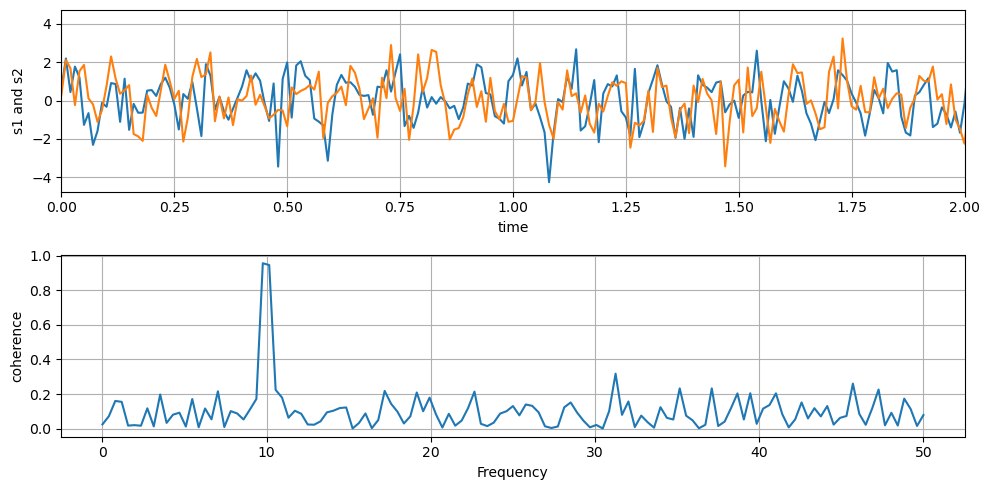

In [10]:
# Adapted from https://matplotlib.org/gallery/lines_bars_and_markers/cohere.html

import numpy as np
import matplotlib.pyplot as plt

dt = 0.01
t = np.arange(0, 30, dt)
nse1 = np.random.randn(len(t))  # white noise 1
nse2 = np.random.randn(len(t))  # white noise 2

# Two signals with a coherent part at 10Hz and a random part
s1 = np.sin(2 * np.pi * 10 * t) + nse1
s2 = np.sin(2 * np.pi * 10 * t) + nse2

fig, axs = plt.subplots(2, 1, figsize=(10, 5))
axs[0].plot(t, s1, t, s2)
axs[0].set_xlim(0, 2)
axs[0].set_xlabel('time')
axs[0].set_ylabel('s1 and s2')
axs[0].grid(True)

cxy, f = axs[1].cohere(s1, s2, 256, 1. / dt)
axs[1].set_ylabel('coherence')

fig.tight_layout()
plt.show()

Even 3-D plots are possible:

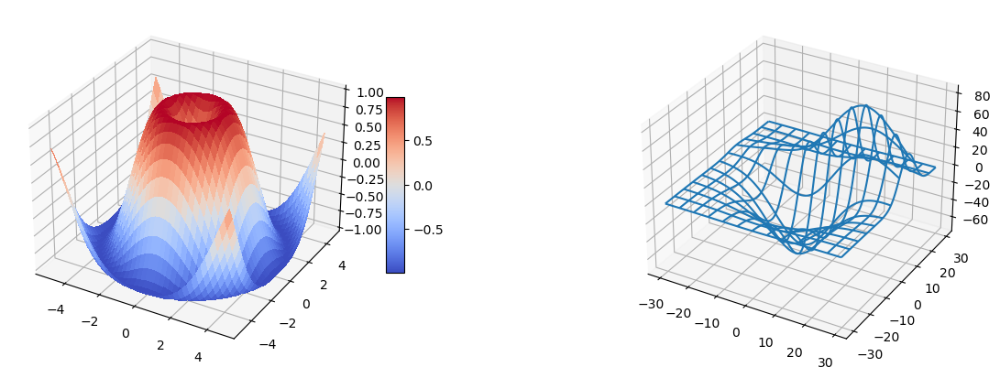

In [11]:
# Adapted from http://matplotlib.org/examples/mplot3d/subplot3d_demo.html

from mpl_toolkits.mplot3d.axes3d import Axes3D
import matplotlib.pyplot as plt

# imports specific to the plots in this example
import numpy as np
from matplotlib import cm
from mpl_toolkits.mplot3d.axes3d import get_test_data

# Twice as wide as it is tall.
fig = plt.figure(figsize=(15, 5))

#---- First subplot
ax = fig.add_subplot(1, 2, 1, projection='3d')
X = np.arange(-5, 5, 0.25)
Y = np.arange(-5, 5, 0.25)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)
surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
ax.set_zlim3d(-1.01, 1.01)

fig.colorbar(surf, shrink=0.5, aspect=10)

#---- Second subplot
ax = fig.add_subplot(1, 2, 2, projection='3d')
X, Y, Z = get_test_data(0.05)
ax.plot_wireframe(X, Y, Z, rstride=10, cstride=10);

## Customization in matplotlib

* matplotlib is infinitely customizable
* As in most modern plotting environments, you can do virtually anything
* You just have to be willing to spend enough time on it

## `matplotlib`

**Pros**
* Provides low-level control over virtually every element of a plot
* Completely object-oriented API; plot components can be easily modified
* Close integration with numpy
* Extremely active community
* Tons of functionality (figure compositing, layering, annotation, coordinate transformations, color mapping, etc.)

**Cons**
* Steep learning curve
* API is extremely unpredictable--redundancy and inconsistency are common
    * Some simple things are hard; some complex things are easy
* Lacks systematicity/organizing syntax--every plot is its own little world
* Simple plots often require a lot of code
* Default styles are not optimal

# High-level interfaces to matplotlib
* Matplotlib is very powerful and very robust, but the API is hit-and-miss
* Many high-level interfaces to matplotlib have been written
    * Abstract away many of the annoying details
    * The best of both worlds: easy generation of plots, but retain `matplotlib`'s power
* [Seaborn](https://stanford.edu/~mwaskom/software/seaborn/index.html), [ggplot](https://matplotlib.org/stable/gallery/style_sheets/ggplot.html), [pandas](https://pandas.pydata.org/), etc.
* Many domain-specific visualization tools are built on `matplotlib` (e.g., [nilearn](https://nilearn.github.io/stable/plotting/index.html) in neuroimaging)

# `Pandas`
* Provides simple but powerful plotting tools
* DataFrame integration supports, e.g., groupby() calls for faceting
* Often the easiest approach for simple data exploration
* Arguably not as powerful, elegant, or intuitive as seaborn

For example, we can plot the `density` of certain variables in our `DataFrame` as easy as:

<Axes: ylabel='Density'>

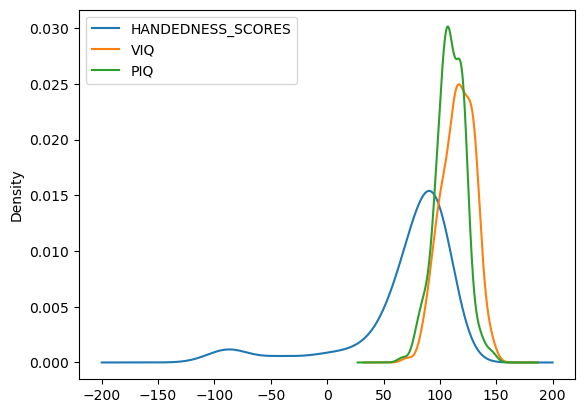

In [12]:
sub_df[['HANDEDNESS_SCORES', 'VIQ', 'PIQ']].plot(kind='kde')

Or create a `boxplot` of the `variables` for each `group`:

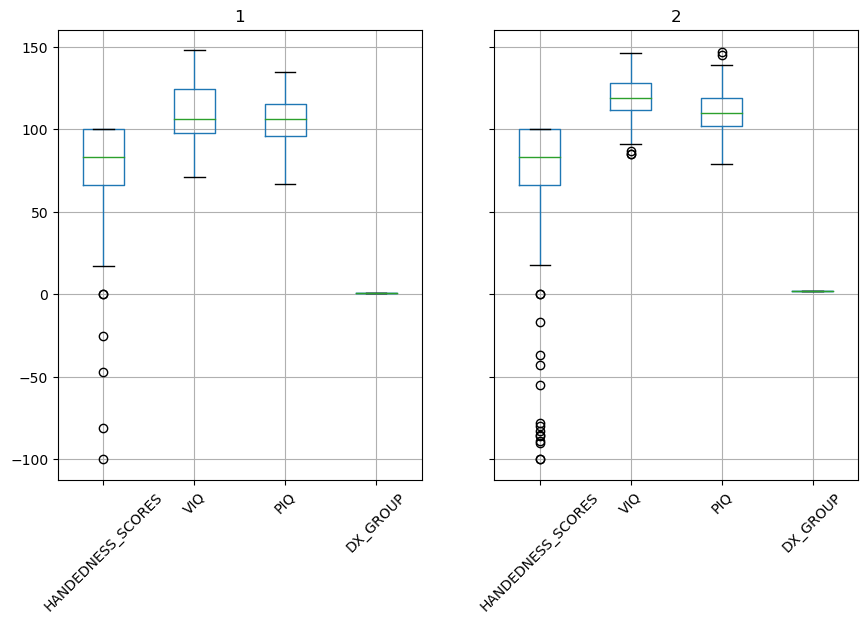

In [13]:
sub_df[['HANDEDNESS_SCORES', 'VIQ', 'PIQ', 'DX_GROUP']].groupby('DX_GROUP').boxplot(rot=45, figsize=(10,6));


# `Seaborn`

[Seaborn](https://seaborn.pydata.org/) abstracts away many of the complexities to deal with such minutiae and provides a high-level API for creating aesthetic plots. 

* Arguably the premier matplotlib interface for high-level plots
* Generates beautiful plots in very little code
    * Beautiful styles and color palettes
* Wide range of supported plots
* Modest support for structured plotting (via grids)
* Exceptional [documentation](https://stanford.edu/~mwaskom/software/seaborn/index.html)
* Generally, the best place to start when exploring data
* Can be quite slow (e.g., with permutation)

For example, the following command auto adjusts the setting for the figure to reflect what you are using the figure for.

In [14]:
import seaborn as sns

In [15]:
# Adjust the context of the plot
sns.set_context('poster') # http://seaborn.pydata.org/tutorial/aesthetics.html#scaling-plot-elements
sns.set_palette('pastel') # http://seaborn.pydata.org/tutorial/color_palettes.html

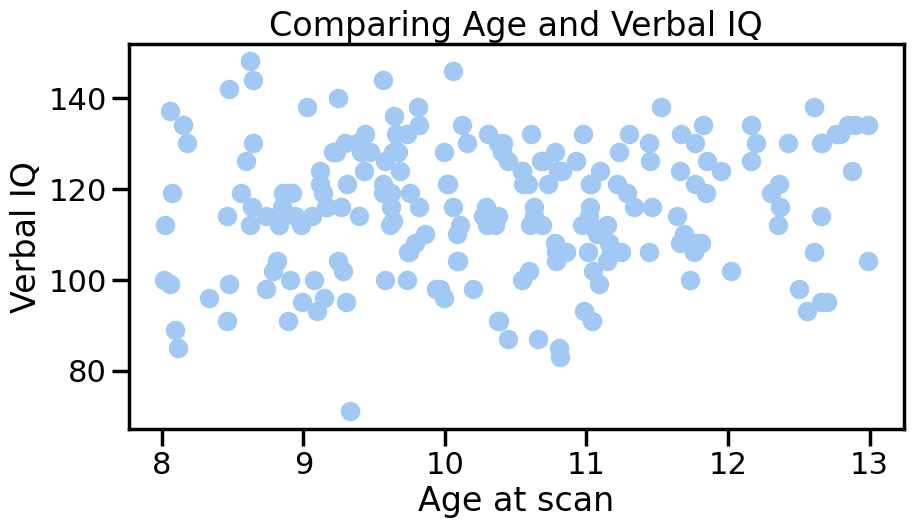

In [16]:
# But still use matplotlib to do the plotting
plt.figure(figsize=(10, 5))
plt.scatter(sub_df['AGE_AT_SCAN '], sub_df.VIQ)
plt.xlabel('Age at scan')
plt.ylabel('Verbal IQ')
plt.title('Comparing Age and Verbal IQ');

In [17]:
# Adjust the context of the plot
sns.set_context('paper')
sns.set_palette('colorblind')

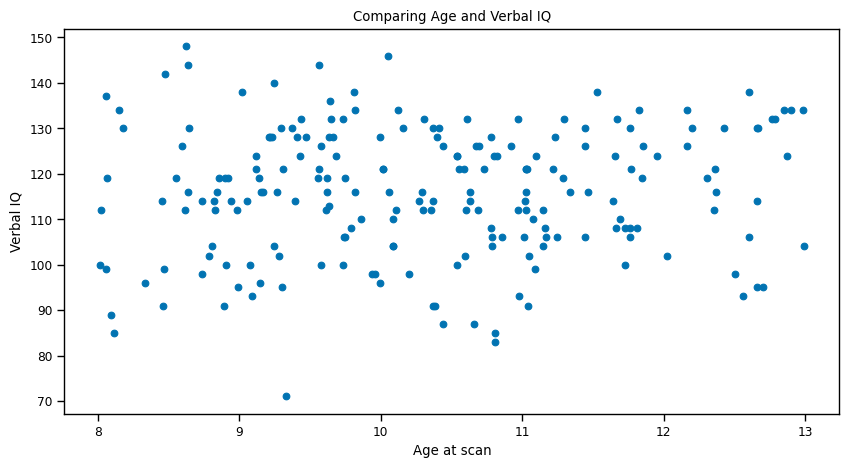

In [18]:
# But still use matplotlib to do the plotting
plt.figure(figsize=(10, 5))
plt.scatter(sub_df['AGE_AT_SCAN '], sub_df.VIQ)
plt.xlabel('Age at scan')
plt.ylabel('Verbal IQ')
plt.title('Comparing Age and Verbal IQ');

Now let's redo the scatter plot in seaborn style.

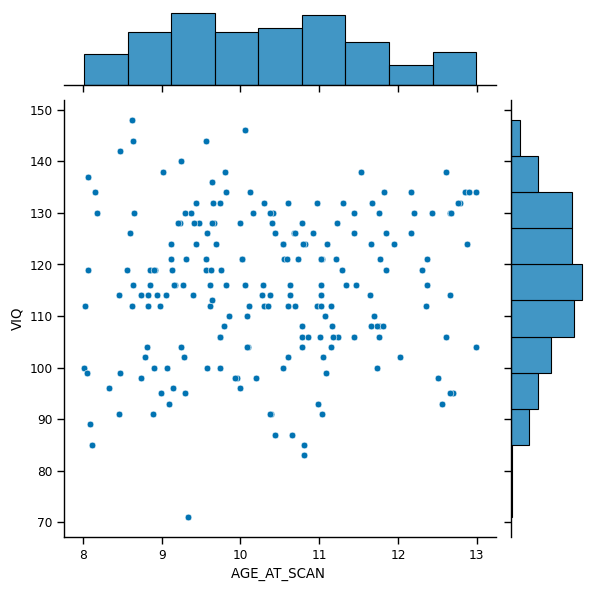

In [19]:
sns.jointplot(x='AGE_AT_SCAN ', y='VIQ', data=sub_df);

## `Seaborn` example

Given the dataset we are using, what would you change to provide a better understanding of the data.

Information about:

- Diagnosis
- Sex

should be encoded separately.

One way to do this with seaborn is to use a more general interface called the [FacetGrid](https://seaborn.pydata.org/generated/seaborn.FacetGrid.html#seaborn.FacetGrid).

Let's replot the figure while learning about a few new commands. Try to understand what the function does and try to change some parameters.

/home/thomas/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:677: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/home/thomas/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:677: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/home/thomas/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:677: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/home/thomas/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:677: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


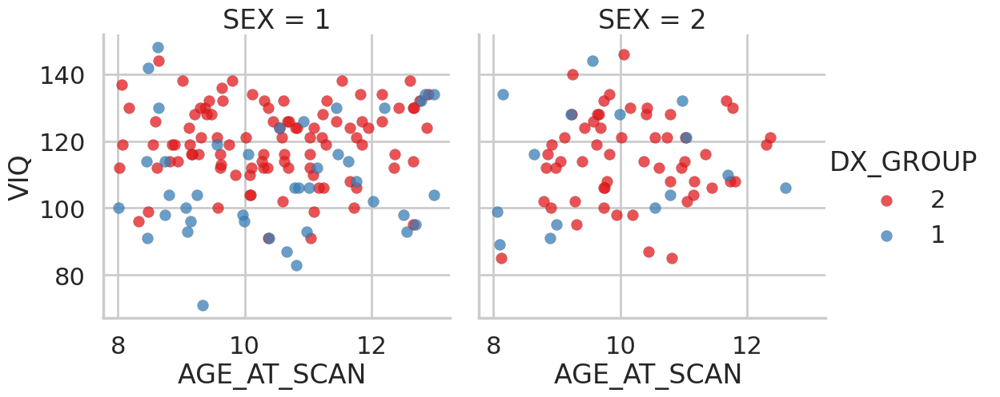

In [21]:
sns.set(style="whitegrid", palette="pastel", color_codes=True)
sns.set_context('poster')

kws = dict(s=100, alpha=0.75, linewidth=0.15, edgecolor="k")

g = sns.FacetGrid(sub_df, col="SEX", hue="DX_GROUP", palette="Set1",
                  hue_order=[1, 2], height=5.5)
g = (g.map(plt.scatter, "AGE_AT_SCAN ", "VIQ", **kws).add_legend())

With just a few lines of code, note how much control you have over the figure.

## Exercise 2

Using a [pairwise plot](http://seaborn.pydata.org/generated/seaborn.pairplot.html#seaborn.pairplot), compare the distributions of `age`, `viq`, and `piq` with respect to `dx_group`.

- Set a palette
- Set style to `ticks`
- Set context to `paper`
- Suppress the `dx_group` variable from being on the plot

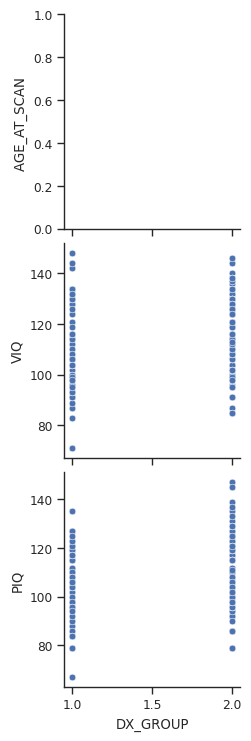

In [52]:
# Create solution here
sns.set(style='ticks', palette='deep', context='paper')
# sns.set_context('paper')
sns.pairplot(data=sub_df, x_vars=['DX_GROUP'], y_vars=['AGE_AT_SCAN ', 'VIQ', 'PIQ'], kind='scatter')
# Suppress the dx_group variable from being on the plot???
# Age does not appear? Wrong scale?

## Exercise 3

Using a [violin plot](http://seaborn.pydata.org/generated/seaborn.violinplot.html#seaborn.violinplot) separate out `viq` as a function of `sex` and `dx_group`.

- Different `dx_group` should be on each half of each violin
- The x-axis should reflect the different `sex` categories.

<Axes: xlabel='SEX', ylabel='VIQ'>

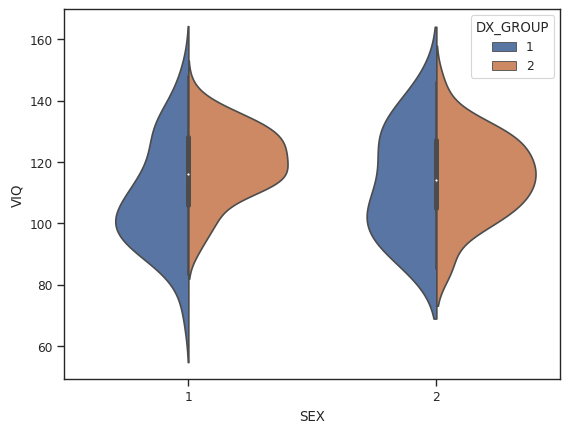

In [49]:
# Create solution here
sns.violinplot(data=sub_df, x='SEX', y='VIQ', hue='DX_GROUP', split=True)

## Showcases from the Gallery

As this notebook is intended as s a showcase to provide you with examples of what `seaborn` can do, we're going to use some examples directly from the [seaborn gallery](https://seaborn.pydata.org/examples/index.html). Just have a look at how easy it is to create a `scatter plot` with `fitted regression` and `distributions`:


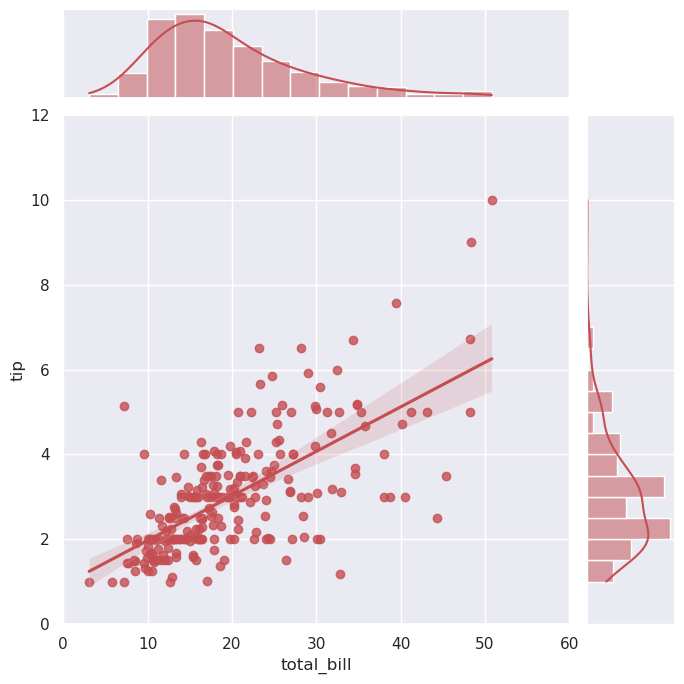

In [53]:
# Adapted from http://seaborn.pydata.org/examples/regression_marginals.html

import seaborn as sns
sns.set(style="darkgrid", color_codes=True)

tips = sns.load_dataset('tips')
g = sns.jointplot(x="total_bill", y="tip", data=tips, kind="reg",
                  xlim=(0, 60), ylim=(0, 12), color="r", height=7)

How about grouped `boxplots`: 

   total_bill   tip     sex smoker  day    time  size
0       16.99  1.01  Female     No  Sun  Dinner     2
1       10.34  1.66    Male     No  Sun  Dinner     3
2       21.01  3.50    Male     No  Sun  Dinner     3
3       23.68  3.31    Male     No  Sun  Dinner     2
4       24.59  3.61  Female     No  Sun  Dinner     4


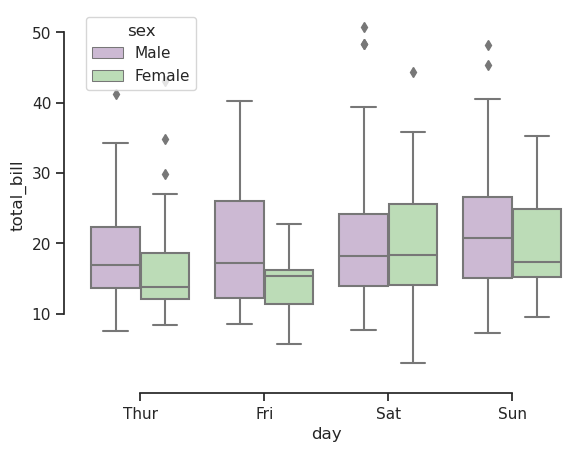

In [54]:
sns.set(style="ticks")

print(tips.head())

# Draw a nested boxplot to show bills by day and sex
sns.boxplot(x="day", y="total_bill", hue="sex", data=tips, palette="PRGn")
sns.despine(offset=10, trim=True)

Or a wide range of `distribution plots`?

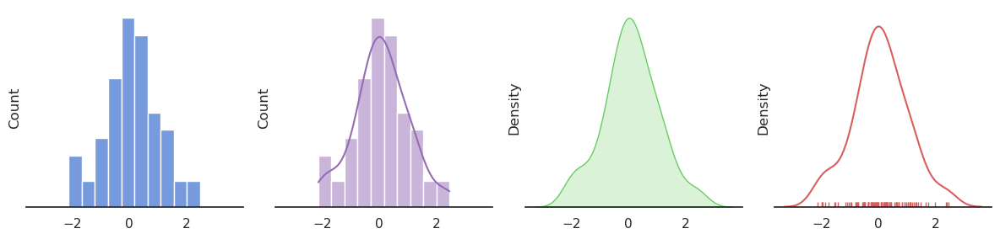

In [55]:
sns.set(style="white", palette="muted", color_codes=True)
rs = np.random.RandomState(10)

# Set up the matplotlib figure
f, axes = plt.subplots(1, 4, figsize=(12, 3), sharex=True)
sns.despine(left=True)

# Generate a random univariate dataset
d = rs.normal(size=100)

# Plot a simple histogram with binsize determined automatically
sns.histplot(d, kde=False, color="b", ax=axes[0])

# Plot a historgram and kernel density estimate
sns.histplot(d, kde=True, color="m", ax=axes[1])

# Plot a filled kernel density estimate
sns.kdeplot(d, fill=True, color="g", ax=axes[2])

# Plot a kernel density estimate and rug plot
sns.kdeplot(d, color="r", ax=axes[3])
sns.rugplot(d, color="r", ax=axes[3])

plt.setp(axes, yticks=[])
plt.tight_layout()

There are also `pairplots` with `fitted regression`:

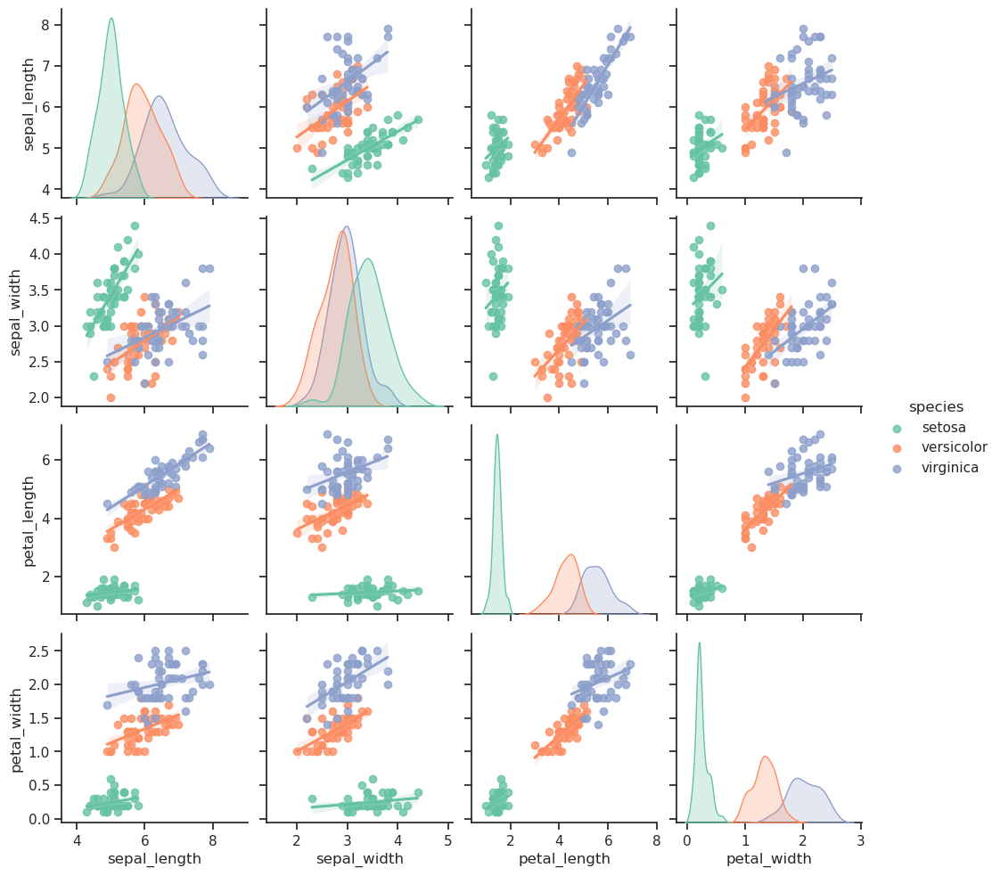

In [56]:
import seaborn as sns
sns.set(style="ticks")

iris = sns.load_dataset('iris')
g = sns.pairplot(iris, hue="species", palette="Set2", kind='reg',
                 diag_kind="kde", height=2.5)

Plotting a large number of `facets` is also no biggie:

/home/thomas/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:677: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/home/thomas/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:677: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/home/thomas/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:677: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/home/thomas/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:677: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/home/thomas/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:677: Fu

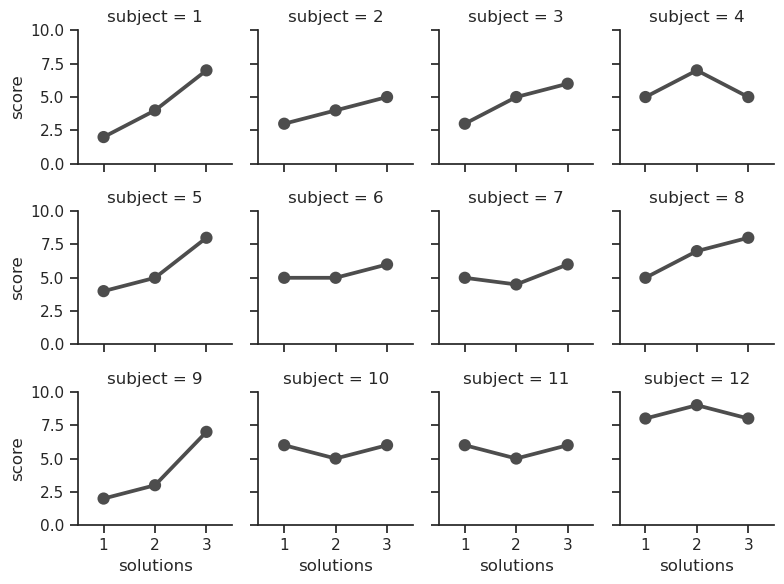

In [57]:
attend = sns.load_dataset('attention').query("subject <= 12")
g = sns.FacetGrid(attend, col="subject", col_wrap=4, height=2, ylim=(0, 10))
g.map(sns.pointplot, "solutions", "score", color=".3", ci=None, order=None);

# Alternatives to matplotlib
* You don't *have* to use `matplotlib`
* Some good reasons to use alternatives:
    * You want to output to HTML, etc.
    * You want something that plays well with other specs or isn't tied to Python
    * You hate matplotlib
* Good news! You have many options...
    * `bokeh`, `plotly`, `HoloViews`...

# `Bokeh`
* A Python visualization engine that outputs directly to the web
* Can render `matplotlib` plots to Bokeh, but not vice versa
* Lets you generate [interactive web-based visualizations](https://demo.bokeh.org/) in pure Python (!)
* You get interactivity for free, and can easily customize them
* Works seamlessly in Jupyter notebooks
* Package development is _incredibly_ fast
* Biggest drawback may be the inability to output static images

**Please note**: if the `Bokeh` plot isn't showing up, please rerun the cell. 

#### Showcases from the Gallery

As this notebook is intended as a showcase to provide you with examples of what `bokeh` can do, we're going to use some examples directly from the [bokeh gallery](https://docs.bokeh.org/en/latest/docs/gallery.html). 

In [61]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.sampledata.iris import flowers

output_notebook()

colormap = {'setosa': 'red', 'versicolor': 'green', 'virginica': 'blue'}
colors = [colormap[x] for x in flowers['species']]

p = figure(title = "Iris Morphology")
p.xaxis.axis_label = 'Petal Length'
p.yaxis.axis_label = 'Petal Width'

p.circle(flowers["petal_length"], flowers["petal_width"],
         color=colors, fill_alpha=0.2, size=10)

show(p)

Loading BokehJS ...

In [63]:
import numpy as np

from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.sampledata.les_mis import data

output_notebook()

nodes = data['nodes']
names = [node['name'] for node in sorted(data['nodes'], key=lambda x: x['group'])]

N = len(nodes)
counts = np.zeros((N, N))
for link in data['links']:
    counts[link['source'], link['target']] = link['value']
    counts[link['target'], link['source']] = link['value']

colormap = ["#444444", "#a6cee3", "#1f78b4", "#b2df8a", "#33a02c", "#fb9a99",
            "#e31a1c", "#fdbf6f", "#ff7f00", "#cab2d6", "#6a3d9a"]

xname = []
yname = []
color = []
alpha = []
for i, node1 in enumerate(nodes):
    for j, node2 in enumerate(nodes):
        xname.append(node1['name'])
        yname.append(node2['name'])

        alpha.append(min(counts[i,j]/4.0, 0.9) + 0.1)

        if node1['group'] == node2['group']:
            color.append(colormap[node1['group']])
        else:
            color.append('lightgrey')

source = ColumnDataSource(data=dict(xname=xname, yname=yname, colors=color,
                                    alphas=alpha, count=counts.flatten()))

p = figure(title="Les Mis Occurrences",
           x_axis_location="above", tools="hover,save",
           x_range=list(reversed(names)), y_range=names)

p.width = 800 # p.plot_width = 800
p.height = 800 # p.plot_height = 800
p.grid.grid_line_color = None
p.axis.axis_line_color = None
p.axis.major_tick_line_color = None
p.axis.major_label_text_font_size = "5pt"
p.axis.major_label_standoff = 0
p.xaxis.major_label_orientation = np.pi/3

p.rect('xname', 'yname', 0.9, 0.9, source=source,
       color='colors', alpha='alphas', line_color=None,
       hover_line_color='black', hover_color='colors')

p.select_one(HoverTool).tooltips = [('names', '@yname, @xname'),
                                    ('count', '@count')]

show(p) # show the plot

Loading BokehJS ...

# `Plot.ly`
* [Plot.ly](https://plot.ly/python/) fills the same niche as Bokeh - web-based visualization via other languages
* Lets you build visualizations either in native code or online

In [68]:
# Adapted from https://plot.ly/python/ipython-notebook-tutorial/

import plotly
plotly.offline.init_notebook_mode()
import plotly.figure_factory as ff
from plotly.graph_objs import *

import pandas as pd

df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/school_earnings.csv")
table = ff.create_table(df)

trace_women = Bar(x=df.School, y=df.Women, name='Women', marker=dict(color='#ffcdd2'))
trace_men = Bar(x=df.School, y=df.Men, name='Men', marker=dict(color='#A2D5F2'))
trace_gap = Bar(x=df.School, y=df.Gap, name='Gap', marker=dict(color='#59606D'))

data = [trace_women, trace_men, trace_gap]
layout = Layout(title="Average Earnings for Graduates",
                xaxis=dict(title='School'),
                yaxis=dict(title='Salary (in thousands)'))
fig = Figure(data=data, layout=layout)

plotly.offline.iplot(fig)

In [69]:
# Adapted from https://plot.ly/python/line-and-scatter/

import plotly
plotly.offline.init_notebook_mode()
import plotly.graph_objs as go

# Create random data with numpy
import numpy as np

N = 100
random_x = np.linspace(0, 1, N)
random_y0 = np.random.randn(N) + 5
random_y1 = np.random.randn(N)
random_y2 = np.random.randn(N) - 5

# Create traces
trace0 = go.Scatter(x=random_x, y=random_y0, mode='lines', name='lines')
trace1 = go.Scatter(x=random_x, y=random_y1, mode='lines+markers', name='lines+markers')
trace2 = go.Scatter(x=random_x, y=random_y2, mode='markers', name='markers')
data = [trace0, trace1, trace2]

plotly.offline.iplot(data, filename='line-mode')

In [70]:
# Adapted from https://plot.ly/python/continuous-error-bars/

import plotly
plotly.offline.init_notebook_mode()
import plotly.graph_objs as go
import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/wind_speed_laurel_nebraska.csv')

upper_bound = go.Scatter(
    name='Upper Bound', x=df['Time'], y=df['10 Min Sampled Avg'] + df['10 Min Std Dev'], mode='lines',
    marker=dict(color="#444444"), line=dict(width=0), fillcolor='rgba(68, 68, 68, 0.3)', fill='tonexty')

trace = go.Scatter(
    name='Measurement', x=df['Time'], y=df['10 Min Sampled Avg'], mode='lines',
    line=dict(color='rgb(31, 119, 180)'), fillcolor='rgba(68, 68, 68, 0.3)', fill='tonexty')

lower_bound = go.Scatter(
    name='Lower Bound', x=df['Time'], y=df['10 Min Sampled Avg']-df['10 Min Std Dev'],
    marker=dict(color="#444444"), line=dict(width=0), mode='lines')

# Trace order can be important with continuous error bars
data = [lower_bound, trace, upper_bound]

layout = go.Layout(yaxis=dict(title='Wind speed (m/s)'),
                   title='Continuous, variable value error bars.', showlegend = False)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='pandas-continuous-error-bars')

In [71]:
# Adapted from https://plot.ly/python/3d-surface-plots/

import plotly
plotly.offline.init_notebook_mode()
import plotly.graph_objs as go
import pandas as pd

# Read data from a csv
z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')

data = [go.Surface(z=z_data.values)]
layout = go.Layout(autosize=True, width=500, height=500, margin=dict(l=65, r=50, b=65, t=90))
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)